In [1]:
import nilearn
import os
import hcp_utils as hcp
from nibabel.testing import data_path
from nilearn import datasets, plotting, regions
import brainspace
import pandas as pd
import numpy as np
import seaborn as sns
import nibabel as nib
import matplotlib.pyplot as plt
from brainspace.utils.parcellation import map_to_labels, reduce_by_labels
from nilearn import signal
from brainspace.gradient import GradientMaps
from nilearn.maskers import NiftiLabelsMasker
from brainspace.gradient.alignment import ProcrustesAlignment

from brainspace.datasets import load_conte69, load_parcellation
from brainspace.plotting import plot_hemispheres
surf_lh, surf_rh = load_conte69()

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [2]:
def parcellate_margulies(grads, n_grad = 26, parc = "schaefer", n_parc = 1000):
    
    parcellation = load_parcellation(parc, scale=n_parc, join=True)
    margulies_grads = nib.load(grads).get_fdata()[:n_grad, :]
    margulies_grads = np.array([hcp.cortex_data(i) for i in margulies_grads])
    parc_grads = np.array([reduce_by_labels(i, parcellation) for i in margulies_grads])
    return parc_grads

In [3]:
schaefer_labels_1000 = load_parcellation('schaefer', scale=1000, join=True)

# Preprocessing

### Visualize Schaefer-400 atlas 

In [4]:
from neuromaps.datasets import fetch_fslr
from surfplot import Plot
from brainspace.datasets import load_parcellation

surfaces = fetch_fslr()
lh, rh = surfaces['inflated']
lh_parc, rh_parc = load_parcellation('schaefer', scale=1000)

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_2484/941990118.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


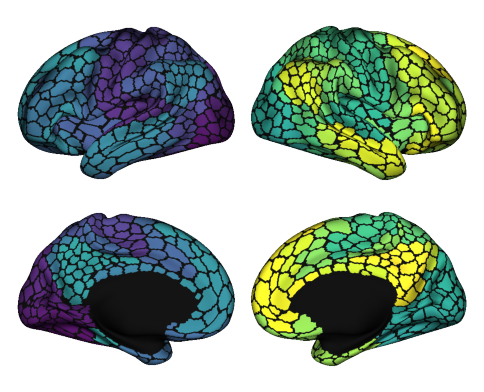

In [5]:
schaefer = Plot(lh, rh)
schaefer.add_layer({'left': lh_parc, 'right': rh_parc}, cbar=False)
schaefer.add_layer({'left': lh_parc, 'right': rh_parc}, cmap='gray',
            as_outline=True, cbar=False)


fig = schaefer.build()
fig.show()

# Extract Gradients

### Load Schaefer-400 on fsLR 32k surface.
#### Map parcellated timeseries onto fsLR surface.

In [6]:
dep_path = 'clean_data/dep/schaefer1000'
controls_path = 'clean_data/controls/schaefer1000'

In [7]:
schaefer_labels = load_parcellation('schaefer', scale=1000, join=True)

#### pick subject

In [8]:
subject = "01"

In [9]:
!pwd


/Users/VictoriaShevchenko/Documents/PhD/rus_depression


In [10]:
subj_clean_ts = np.load(f"{dep_path}/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_schaefer1000_desc-clean_bold.npy")

In [11]:
subj_clean_ts.shape

(90, 1000)

In [12]:
subj_correlation_matrix = np.corrcoef(subj_clean_ts.T)

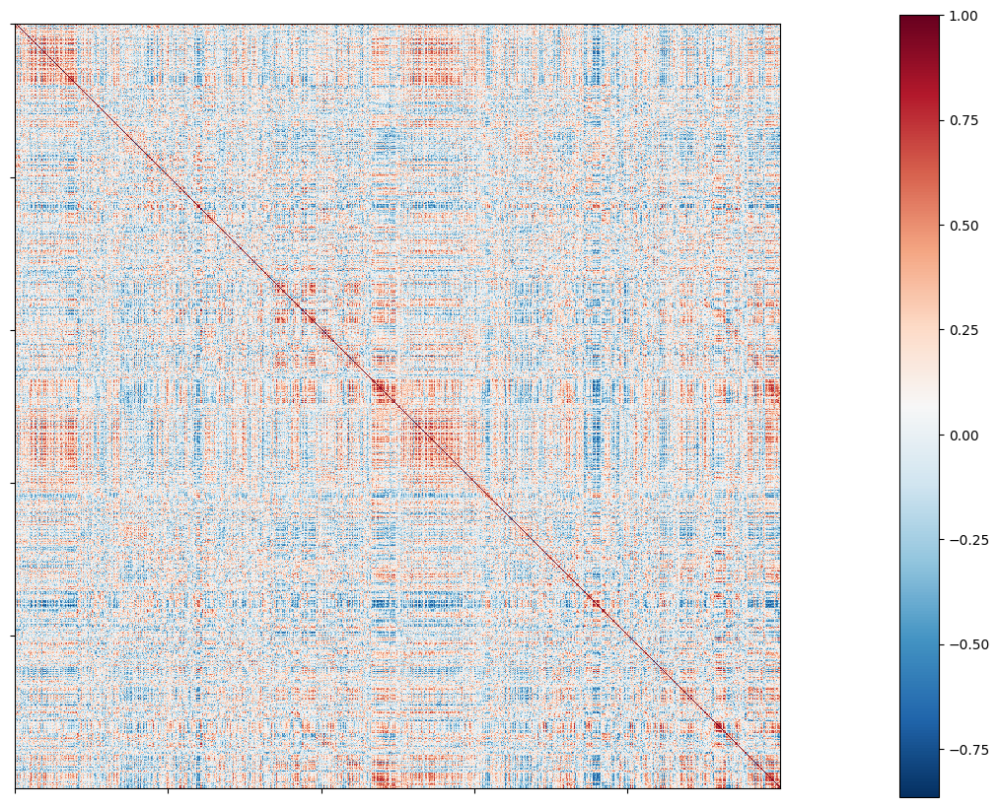

In [13]:
corr_plot = plotting.plot_matrix(subj_correlation_matrix, figure=(10, 10))

In [14]:
gm = GradientMaps(n_components=3, kernel = "cosine", approach= 'pca')
gm.fit(subj_correlation_matrix)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

In [15]:
grad_subj = [None] * 3

for i, g in enumerate(gm.gradients_.T):
    grad_subj[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)

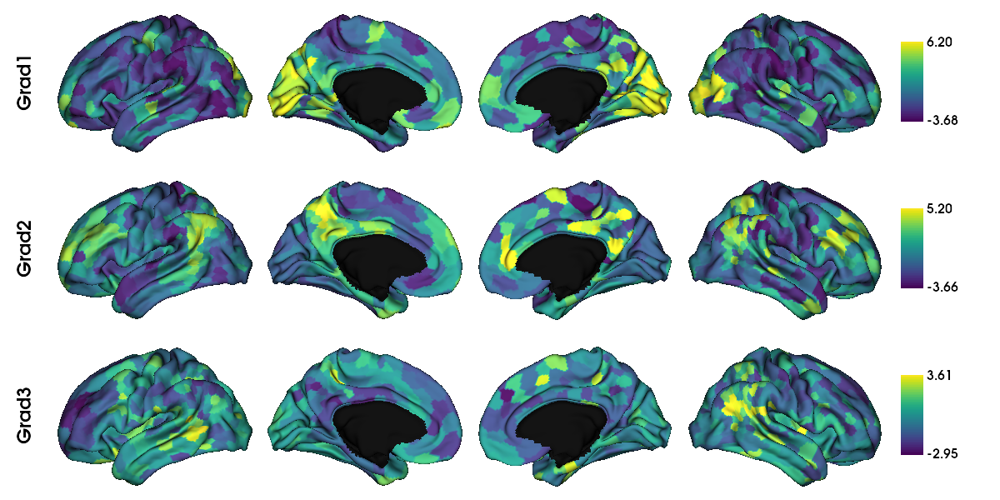

In [16]:
plot_hemispheres(surf_lh, surf_rh, array_name=grad_subj, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

# Schaefer 1000: individuals

In [17]:
dep_subjects = np.loadtxt("preprocessing/Bezmaternykh_dep_subjects.txt", dtype = str)
control_subjects = np.loadtxt("preprocessing/Bezmaternykh_controls_subjects.txt", dtype = str)
n_parcels = 1000


In [18]:
# Save conn matrices for each subject

for subject in dep_subjects:
    subj_dir = f"{dep_path}/sub-{subject}/func"
    ts_paths = [path for path in os.listdir(subj_dir) if "task-rest" in path]
    
    if len(ts_paths) > 1:
        ts_ses2 = np.load(f"{subj_dir}/{ts_paths[0]}")
        ts_ses1 = np.load(f"{subj_dir}/{ts_paths[1]}")

        subj_ts = np.row_stack([ts_ses1, ts_ses2])
    else:
        subj_ts = np.load(f"{subj_dir}/{ts_paths[0]}")

    conn_mat = np.corrcoef(subj_ts.T)
    conn_mat =np.arctanh(conn_mat)

    np.save(f'{subj_dir}/z_conn_matrix_{subject}_schaefer1000', conn_mat)


for subject in control_subjects:
    subj_dir = f"clean_data/controls/schaefer{n_parcels}/sub-{subject}/func"
    ts_paths = [path for path in os.listdir(subj_dir) if "task-rest" in path]
    
    if len(ts_paths) > 1:
        ts_ses2 = np.load(f"{subj_dir}/{ts_paths[0]}")
        ts_ses1 = np.load(f"{subj_dir}/{ts_paths[1]}")
        subj_ts = np.row_stack([ts_ses1, ts_ses2])
    else:
        subj_ts = np.load(f"{subj_dir}/{ts_paths[0]}")

    conn_mat = np.corrcoef(subj_ts.T)
    conn_mat =np.arctanh(conn_mat)

    np.save(f'{subj_dir}/z_conn_matrix_{subject}_schaefer1000', conn_mat)

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_2484/2673708741.py:16: RuntimeWarning: divide by zero encountered in arctanh
  conn_mat =np.arctanh(conn_mat)
/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_2484/2673708741.py:33: RuntimeWarning: divide by zero encountered in arctanh
  conn_mat =np.arctanh(conn_mat)


## Extract Gradients

In [19]:
zcorr = np.load(f"{controls_path}/sub-{subject}/func/z_conn_matrix_{subject}_schaefer1000.npy")

In [20]:
zcorr.shape

(1000, 1000)

In [21]:
n_grads = 10

for subject in dep_subjects:
    zcorr = np.load(f"{dep_path}/sub-{subject}/func/z_conn_matrix_{subject}_schaefer1000.npy")
    if np.isnan(zcorr).any():
        nan_indices = np.where(np.isnan(zcorr))
        zcorr[nan_indices] = .0000000001
    if np.isinf(zcorr).any():
        inf_indices = np.where(np.isinf(zcorr))
        zcorr[inf_indices] = 1
    gm = GradientMaps(n_components=n_grads, kernel = "cosine", approach= 'pca')
    gm.fit(zcorr)
    np.save(f"{dep_path}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000", gm.gradients_)


for subject in control_subjects:
    zcorr = np.load(f"{controls_path}/sub-{subject}/func/z_conn_matrix_{subject}_schaefer1000.npy")
    if np.isnan(zcorr).any():
        nan_indices = np.where(np.isnan(zcorr))
        zcorr[nan_indices] = .0000000001
    if np.isinf(zcorr).any():
        inf_indices = np.where(np.isinf(zcorr))
        zcorr[inf_indices] = 1
    gm = GradientMaps(n_components=n_grads, kernel = "cosine", approach= 'pca')
    gm.fit(zcorr)
    np.save(f"{controls_path}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000", gm.gradients_)

## Align Gradients

In [22]:
margulies_2016 = parcellate_margulies('/Users/VictoriaShevchenko/Documents/PhD/HCP/Gradients_Margulies2016/hcp.gradients.dscalar.nii', 10)
#np.save("margulies_grads_schaefer1000", margulies_2016)

In [23]:
# gradient alignment
for subject in dep_subjects:
    subj_grads = np.load(f"{dep_path}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000.npy")
    aligned_grads = ProcrustesAlignment(verbose=True).fit(np.expand_dims(subj_grads, axis = 0), margulies_2016.T).aligned_[0]
    np.save(f"{dep_path}/sub-{subject}/func/aligned_{n_grads}grads_{subject}_schaefer1000", aligned_grads)
    os.remove(f'{dep_path}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000.npy')

for subject in control_subjects:
    subj_grads = np.load(f"{controls_path}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000.npy")
    aligned_grads = ProcrustesAlignment(verbose=True).fit(np.expand_dims(subj_grads, axis = 0), margulies_2016.T).aligned_[0]
    np.save(f"{controls_path}/sub-{subject}/func/aligned_{n_grads}grads_{subject}_schaefer1000", aligned_grads)
    os.remove(f'{controls_path}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000.npy')


Iteration   0: 25480.686850
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 25160.761874
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 27060.166581
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 30463.328088
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 24306.831414
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 26290.399263
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 23566.025309
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 25516.732357
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 27546.195297
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 28178.668691
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 25983.458104
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 27874.580082
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 27537.647796
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   

In [24]:
# sanity check
subject = '02'
aligned_grads = np.load(f"{dep_path}/sub-{subject}/func/aligned_{n_grads}grads_{subject}_schaefer1000.npy")


grad_mapped= [None]  * 3
for i, g in enumerate(aligned_grads.T[:3]):
    grad_mapped[i] = map_to_labels(g, schaefer_labels_1000, mask=schaefer_labels_1000 != 0, fill=np.nan)

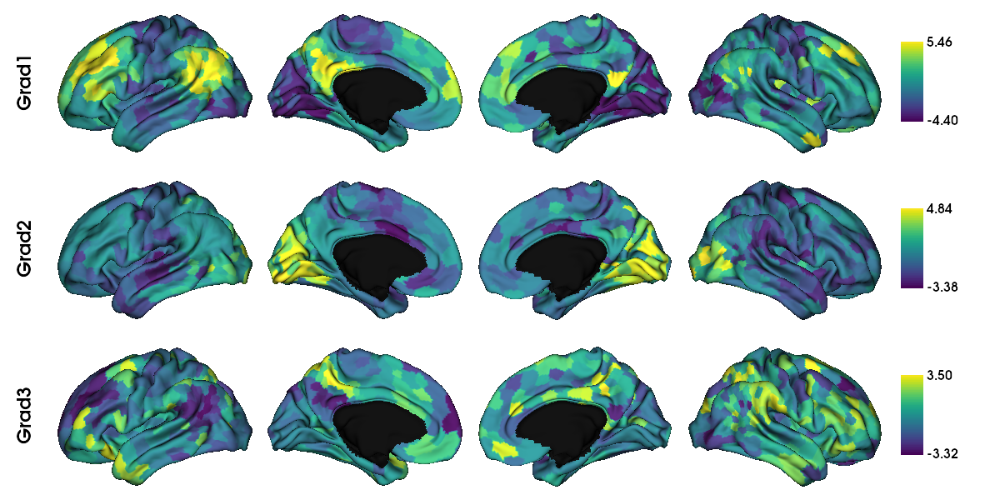

In [25]:
surf_lh, surf_rh = load_conte69()
plot_hemispheres(surf_lh, surf_rh, array_name=grad_mapped, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

## Group Gradients

In [26]:
dep_conn_matrices = []
control_conn_matrices = []

for subject in dep_subjects:
    subj_dir = f"{dep_path}/sub-{subject}/func"
    conn_mat = np.load(f"{subj_dir}/z_conn_matrix_{subject}_schaefer1000.npy")
    dep_conn_matrices.append(conn_mat)
dep_conn_matrices = np.asarray(dep_conn_matrices)

for subject in control_subjects:
    subj_dir = f"{controls_path}/sub-{subject}/func"
    conn_mat = np.load(f"{subj_dir}/z_conn_matrix_{subject}_schaefer1000.npy")
    control_conn_matrices.append(conn_mat)
control_conn_matrices = np.asarray(control_conn_matrices)

In [27]:
dep_conn_matrices.shape

(51, 1000, 1000)

In [28]:
control_conn_matrices.shape

(21, 1000, 1000)

In [29]:
dep_conn_mean = np.mean(dep_conn_matrices, axis = 0)
control_conn_mean = np.mean(control_conn_matrices, axis = 0)

dep_conn_mean = np.tanh(dep_conn_mean)
if np.isnan(dep_conn_mean).any():
    nan_indices = np.where(np.isnan(dep_conn_mean))
    dep_conn_mean[nan_indices] = .0000000001
if np.isinf(dep_conn_mean).any():
    inf_indices = np.where(np.isinf(dep_conn_mean))
    dep_conn_mean[inf_indices] = 1

control_conn_matrices = np.tanh(control_conn_mean)
if np.isnan(control_conn_mean).any():
    nan_indices = np.where(np.isnan(control_conn_mean))
    control_conn_matrices[nan_indices] = .0000000001
if np.isinf(control_conn_mean).any():
    inf_indices = np.where(np.isinf(control_conn_mean))
    control_conn_mean[inf_indices] = 1


np.save(arr = dep_conn_mean, file = f"{dep_path}/dep_group_conn_matrix_schaefer1000")
np.save(arr = control_conn_mean, file = f"{controls_path}/control_group_conn_matrix_schaefer1000")



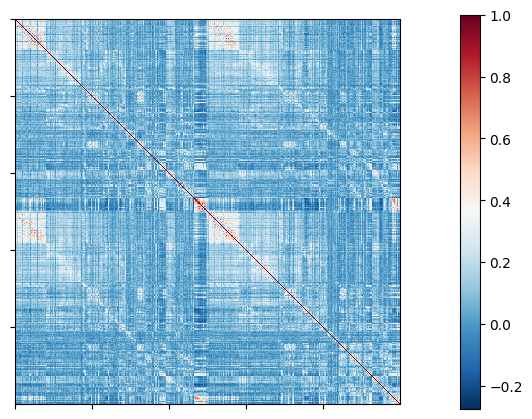

In [30]:
corr_plot = plotting.plot_matrix(dep_conn_mean, figure=(5, 5))

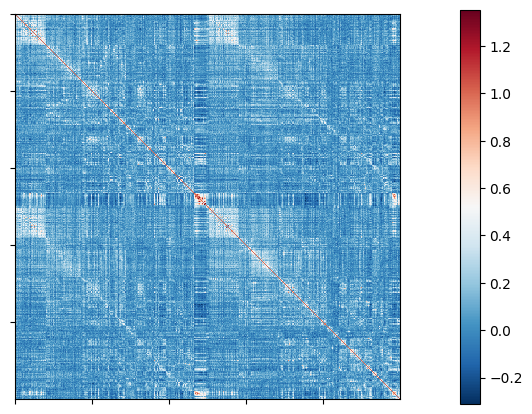

In [38]:
corr_plot = plotting.plot_matrix(control_conn_mean, figure=(5, 5))

In [39]:
gm = GradientMaps(n_components=10, kernel = "cosine", approach= 'pca')
gm.fit(dep_conn_mean)
np.save(f"{dep_path}/dep_group_10grads_schaefer1000", gm.gradients_)


gm = GradientMaps(n_components=10, kernel = "cosine", approach= 'pca')
gm.fit(control_conn_mean)
np.save(f"{controls_path}/control_group_10grads_schaefer1000", gm.gradients_)


In [40]:
# align group gradients

dep_group_grads = np.load(f"{dep_path}/dep_group_10grads_schaefer1000.npy")
aligned_dep_grads = ProcrustesAlignment(verbose=True).fit(np.expand_dims(dep_group_grads, axis = 0), margulies_2016.T).aligned_[0]
np.save(f"{dep_path}/aligned_dep_group_10grads_schaefer1000", aligned_dep_grads)

control_group_grads = np.load(f"{controls_path}/control_group_10grads_schaefer1000.npy")
aligned_control_grads = ProcrustesAlignment(verbose=True).fit(np.expand_dims(control_group_grads, axis = 0), margulies_2016.T).aligned_[0]
np.save(f"{controls_path}/aligned_control_group_10grads_schaefer1000", aligned_control_grads)


Iteration   0: 18511.510453
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 16845.603689
Iteration   1: 0.000000
Iteration   2: 0.000000


In [32]:
aligned_dep_grads.shape

(1000, 10)

In [41]:
labeled_dep_group_grad = [None] * 3
labeled_controls_group_grad = [None] * 3

for i, g in enumerate(aligned_dep_grads[:, :3].T):
    labeled_dep_group_grad[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)

for i, g in enumerate(aligned_control_grads[:, :3].T):
    labeled_controls_group_grad[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)


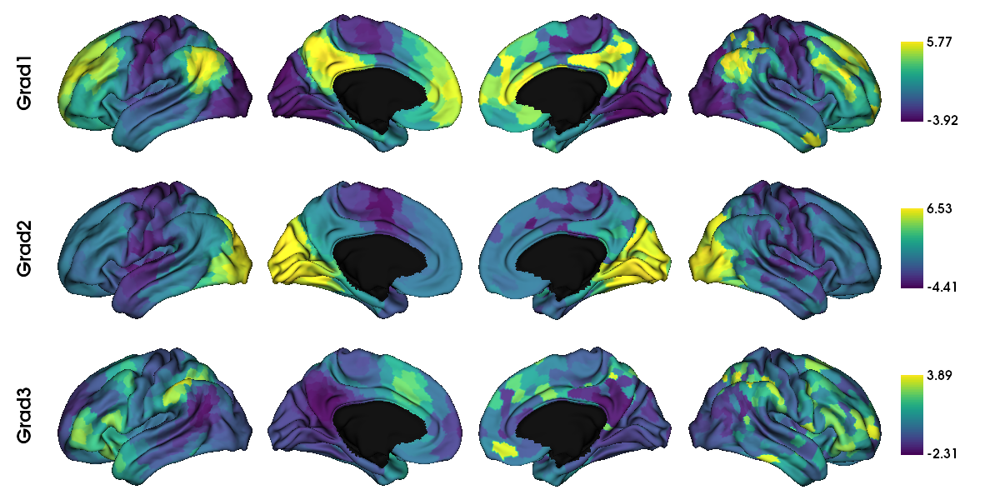

In [42]:
plot_hemispheres(surf_lh, surf_rh, array_name=labeled_dep_group_grad, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

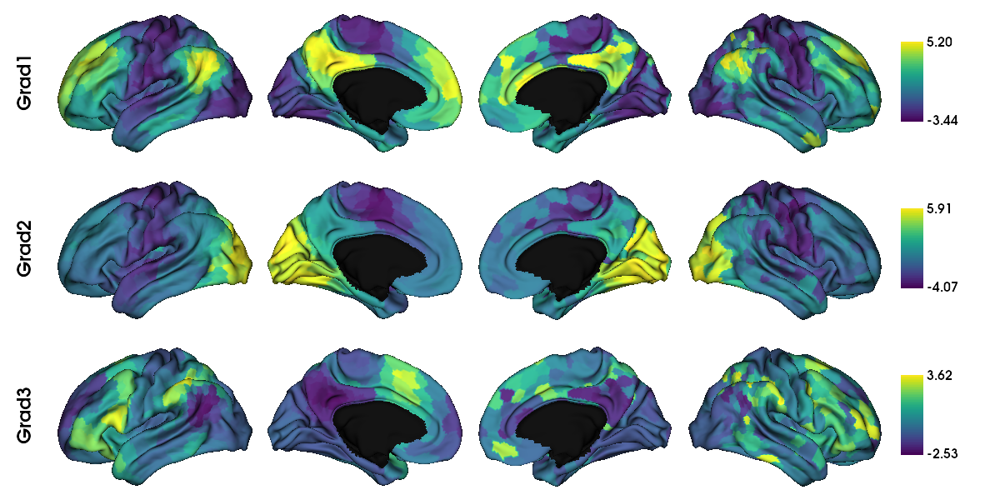

In [43]:
plot_hemispheres(surf_lh, surf_rh, array_name=labeled_controls_group_grad, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

In [84]:
dep_group_grad_df = pd.DataFrame(gm.gradients_, columns = ["Grad 1", "Grad 2", "Grad 3"])

In [86]:
import plotly.express as px

fig = px.scatter_3d(dep_group_grad_df, x="Grad 2", y="Grad 3", z="Grad 1",
              color="Grad 2", color_continuous_scale=px.colors.sequential.Viridis) #color_continuous_scale=['blue','yellow', 'red']

fig.update_traces(marker_size = 3)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="white",
                         gridcolor="rgb(220, 220, 220)",
                         showbackground=True,
                         zerolinecolor="white",
                         title = "Gradient 2",),
                    yaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 3",),
                    zaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 1",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

In [7]:
import os
n_parcels = 400
for subject in dep_subjects:
    output_dir = f"clean_data/gradients/dep/schaefer{n_parcels}/sub-{subject}"
    subject_ts_path = f"clean_data/dep/schaefer{n_parcels}/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_schaefer{n_parcels}_desc-clean_bold.npy"
    subject_ts = np.load(subject_ts_path)
    subject_ts = np.row_stack(subject_ts)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    conn = np.corrcoef(subject_ts.T)
    np.save(arr = conn, file = f"{output_dir}/{subject}_conn_matrix")
    gm = GradientMaps(n_components=10, kernel = "cosine", approach= 'pca')
    gm.fit(conn)
    np.save(arr = gm.gradients_.T, file = f"{output_dir}/{subject}_gradients")
    

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

In [9]:
for subject in control_subjects:
    output_dir = f"clean_data/gradients/controls/schaefer{n_parcels}/sub-{subject}"
    subject_ts_path = f"clean_data/controls/schaefer{n_parcels}/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_schaefer{n_parcels}_desc-clean_bold.npy"
    subject_ts = np.load(subject_ts_path)
    subject_ts = np.row_stack(subject_ts)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    conn = np.corrcoef(subject_ts.T)
    np.save(arr = conn, file = f"{output_dir}/{subject}_conn_matrix")
    gm = GradientMaps(n_components=3, kernel = "cosine", approach= 'pca')
    gm.fit(conn)
    np.save(arr = gm.gradients_.T, file = f"{output_dir}/{subject}_gradients")

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

# Schaefer 1000

In [90]:
ts = []
for subject in subjects:
    subject_ts_path = f"/Users/VictoriaShevchenko/Documents/PhD/COBRE/clean_data/dep/schaefer1000/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_schaefer1000_desc-clean_bold.npy"
    subject_ts = np.load(subject_ts_path)
    subject_ts = np.row_stack(subject_ts)
    ts.append(subject_ts)

In [91]:
conn_matrices = []
for subject_ts in ts:
    #conn = np.corrcoef(subject_ts.T)
    conn = np.arctanh(np.corrcoef(subject_ts.T))
    conn_matrices.append(conn)
conn_matrices = np.asarray(conn_matrices)

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_57549/141645875.py:4: RuntimeWarning:

divide by zero encountered in arctanh



In [92]:
conn_mean = np.mean(conn_matrices, axis = 0)
conn_mean = np.tanh(conn_mean)
conn_mean.shape

(1000, 1000)

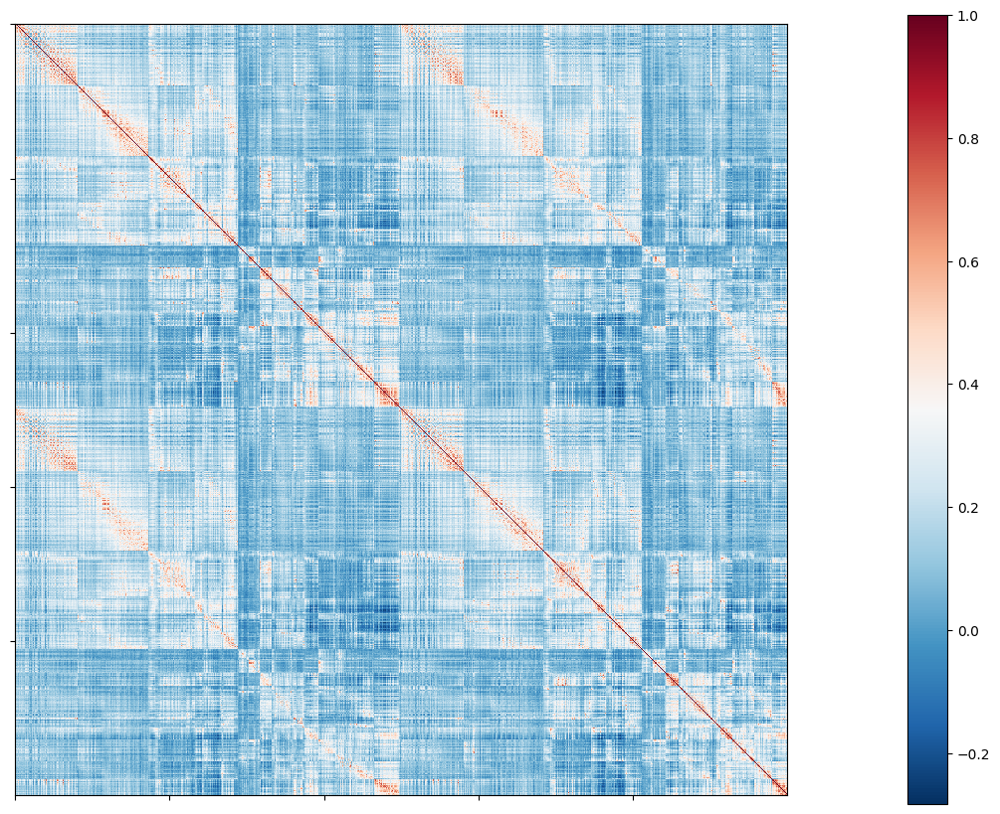

In [93]:
corr_plot = plotting.plot_matrix(conn_mean, figure=(10, 10))

In [94]:
gm = GradientMaps(n_components=3, kernel = "cosine", approach= 'pca')
gm.fit(conn_mean)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

In [95]:
dep_group_grad_schaefer1000 = [None] * 3

for i, g in enumerate(gm.gradients_.T):
    dep_group_grad_schaefer1000[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)

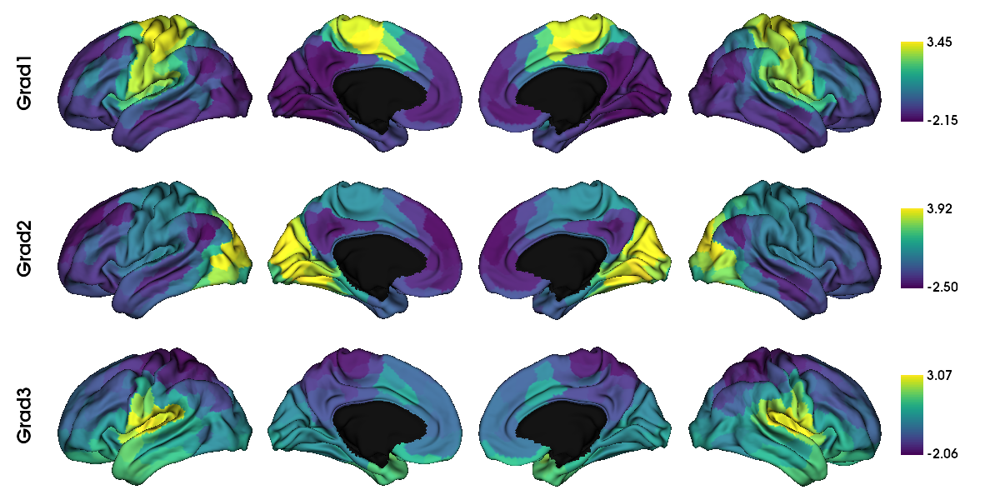

In [96]:
plot_hemispheres(surf_lh, surf_rh, array_name=dep_group_grad, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

In [97]:
dep_group_grad_schaefer1000_df = pd.DataFrame(gm.gradients_, columns = ["Grad 1", "Grad 2", "Grad 3"])

In [99]:
fig = px.scatter_3d(dep_group_grad_schaefer1000_df, x="Grad 2", y="Grad 3", z="Grad 1",
              color="Grad 2", color_continuous_scale=px.colors.sequential.Viridis) #color_continuous_scale=['blue','yellow', 'red']

fig.update_traces(marker_size = 2)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="white",
                         gridcolor="rgb(220, 220, 220)",
                         showbackground=True,
                         zerolinecolor="white",
                         title = "Gradient 2",),
                    yaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 3",),
                    zaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 1",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

# Neurotypical Controls

In [23]:
control_subjects = np.loadtxt("COBRE_control_subjects.txt", dtype = str)

In [29]:
control_ts = []
for subject in control_subjects:
    subject_ts_path = f"/Users/VictoriaShevchenko/Documents/PhD/COBRE/clean_data/controls/schaefer400/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_schaefer400_desc-clean_bold.npy"
    subject_ts = np.load(subject_ts_path)
    subject_ts = np.row_stack(subject_ts)
    control_ts.append(subject_ts)

In [30]:
control_conn_matrices = []
for subject_ts in control_ts:
    #conn = np.corrcoef(subject_ts.T)
    conn = np.arctanh(np.corrcoef(subject_ts.T))
    control_conn_matrices.append(conn)
control_conn_matrices = np.asarray(control_conn_matrices)

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_73600/1602707713.py:4: RuntimeWarning: divide by zero encountered in arctanh
  conn = np.arctanh(np.corrcoef(subject_ts.T))


In [31]:
control_conn_matrices.shape

(91, 400, 400)

In [32]:
control_conn_mean = np.mean(control_conn_matrices, axis = 0)
control_conn_mean = np.tanh(control_conn_mean)
control_conn_mean.shape

(400, 400)

In [33]:
np.save(arr = control_conn_mean, file = "clean_data/gradients/controls/schaefer400/control_group_conn_matrix")

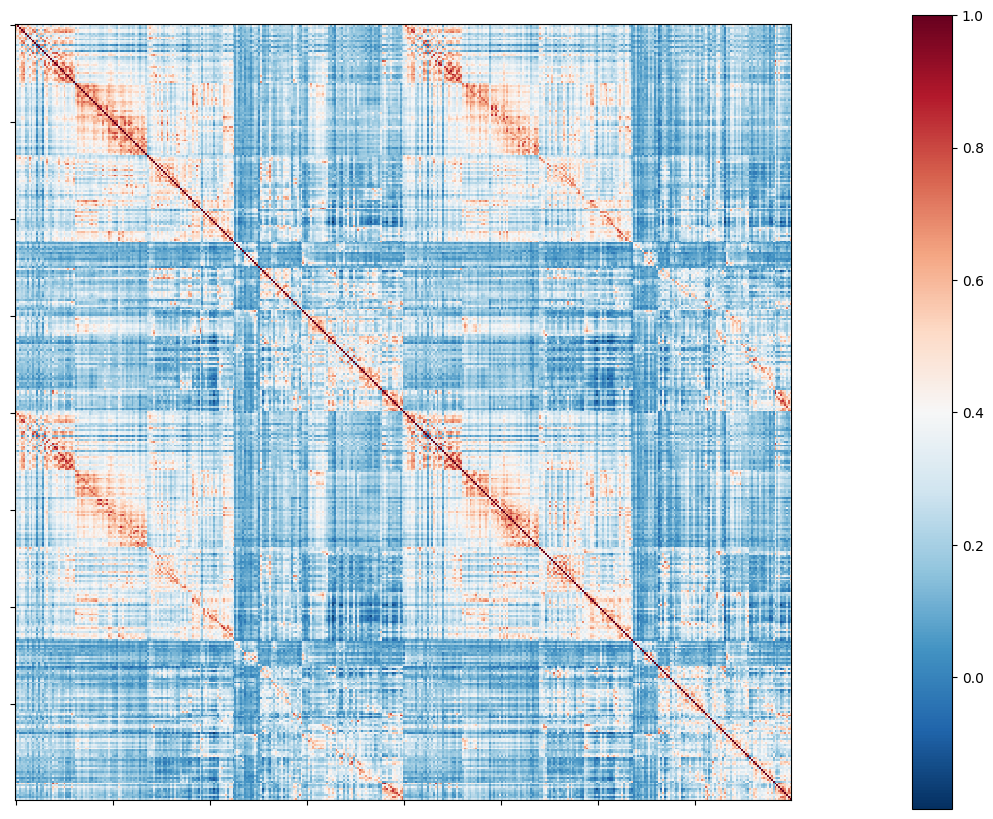

In [34]:
corr_plot = plotting.plot_matrix(control_conn_mean, figure=(10, 10))

In [40]:
gm = GradientMaps(n_components=3, kernel = "cosine", approach= 'pca')
gm.fit(control_conn_mean)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

In [41]:
control_group_grad = [None] * 3

for i, g in enumerate(gm.gradients_.T):
    control_group_grad[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)

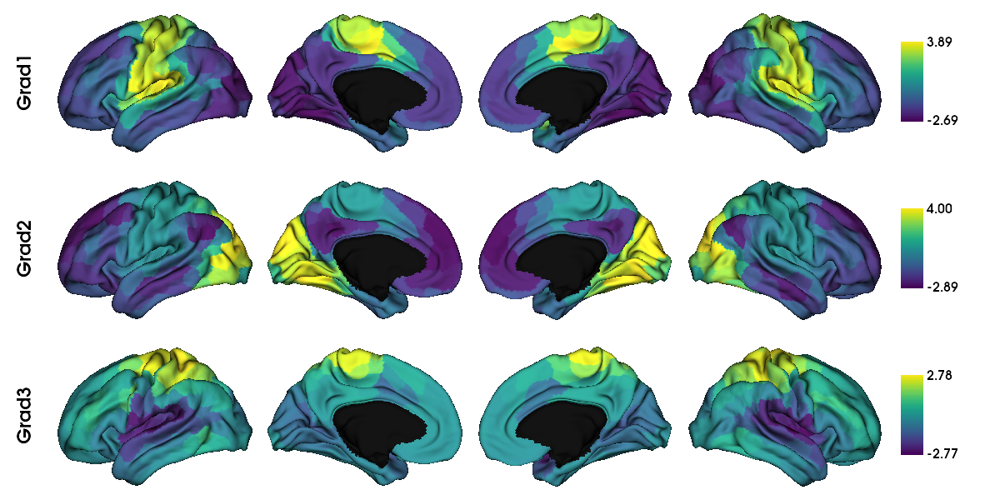

In [39]:

plot_hemispheres(surf_lh, surf_rh, array_name=control_group_grad, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

In [42]:
np.save(arr = gm.gradients_.T, file = "clean_data/gradients/controls/schaefer400/control_group_grads")

In [132]:
control_group_grad_schaefer1000_df = pd.DataFrame(gm.gradients_, columns = ["Grad 1", "Grad 2", "Grad 3"])


In [133]:
fig = px.scatter_3d(control_group_grad_schaefer1000_df, x="Grad 2", y="Grad 3", z="Grad 1",
              color="Grad 2", color_continuous_scale=px.colors.sequential.Viridis) #color_continuous_scale=['blue','yellow', 'red']

fig.update_traces(marker_size = 2)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="white",
                         gridcolor="rgb(220, 220, 220)",
                         showbackground=True,
                         zerolinecolor="white",
                         title = "Gradient 2",),
                    yaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 3",),
                    zaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 1",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

# Resample Margulies grads

In [5]:
marguluies_grads = np.load("/Users/VictoriaShevchenko/Documents/PhD/margulies_grads_32K.npy")


In [7]:
import hcp_utils as hcp
margulies_grads_labeled = np.array([hcp.cortex_data(i) for i in marguluies_grads])
margulies_grads_labeled.shape

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


(3, 64984)

In [8]:
margulies_grads_schaefer400 = reduce_by_labels(margulies_grads_labeled, labels=schaefer_labels)

NameError: name 'schaefer_labels' is not defined

In [35]:

fig = px.scatter_3d(x=margulies_grads_schaefer400[1], y=margulies_grads_schaefer400[2], z=margulies_grads_schaefer400[0],
              color=margulies_grads_schaefer400[0], color_continuous_scale=px.colors.sequential.Viridis) #color_continuous_scale=['blue','yellow', 'red']

fig.update_traces(marker_size = 3)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="white",
                         gridcolor="rgb(220, 220, 220)",
                         showbackground=True,
                         zerolinecolor="white",
                         title = "Gradient 2",),
                    yaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 3",),
                    zaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 1",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )